In [125]:
##################################################################################################################
################---------------------------Data Extraction----------------------------############################
##################################################################################################################

import gzip
import numpy as np
from numpy import unique

dict_nodes=list()
dict_node_color=list()
dict_dep=list()
dict_edges=list()
dict_edges_weight=list()
dict_attrib={}

#Extract department item from nodes
with gzip.open('email-Eu-core-department-labels.txt.gz','rt') as f:
    for line in f:
        #print('got line', line) #safe in dictanary
        node_item=[int(s) for s in line.split() if s.isdigit()]
        dict_nodes.append(node_item[0])
        dict_dep.append(node_item[1])
        dict_node_color.append(node_item[1]/41.0)
        dict_attrib.__setitem__(node_item[0], node_item[1]) 
#print(min(dict_dep))
        
#Extract edges between nodes
with gzip.open('email-Eu-core.txt.gz','rt') as f:
    for line in f:
        #print('got line', line) #safe in dictanary
        edge_item=[int(s) for s in line.split() if s.isdigit()]
        dict_edges.append(edge_item)     

'''
#order by departments
departments=unique(dict_dep)
print(departments)
shells=list()

for dep_item in departments:
    values=[]
    indices = [i for i, x in enumerate(dict_dep) if x == dep_item]
    shells.append(indices) 
#print(shells)
'''
print('Status: Extracting file content finished')        


Status: Extracting file content finished


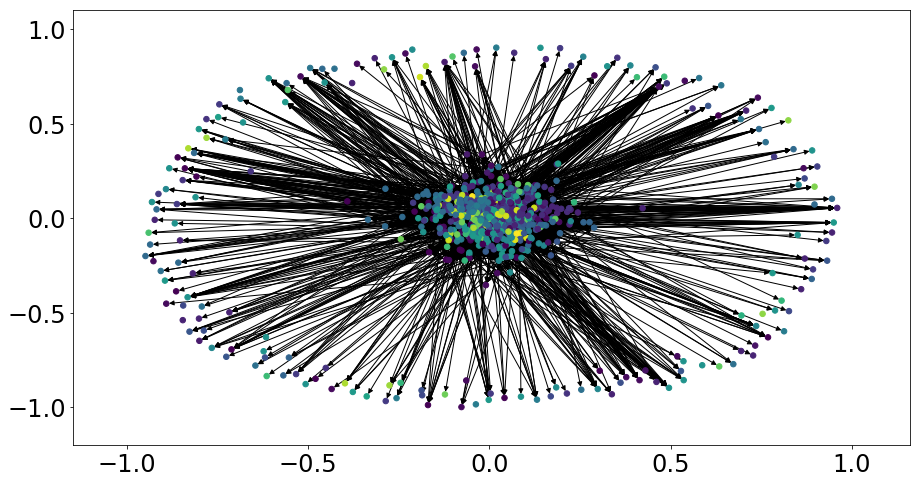

In [72]:
##################################################################################################################
##################---------------------------Plot DiGraph----------------------------#############################
##################################################################################################################

import networkx as nx
import matplotlib.pyplot as plt

G = nx.DiGraph()
count=0
for item in dict_edges:
    node1=item[0]
    node2=item[1]
    G.add_edge(node1, node2)    
nx.set_node_attributes(G,dict_attrib,'department')
#print(G.node[10]['department'])
fig= plt.figure(figsize=(15,8))
# Draw the graph
pos = nx.spring_layout(G) # set the positions of the nodes/edges/labels
nx.draw_networkx(G, pos=pos,nodelist=dict_nodes,node_size=30,node_color=dict_node_color,with_labels=False)
plt.show()


---------------------
avg shortest path 2.586933824816466
number of nodes biggest subgraph 986
cluster coefficient: 0.40705044751953817
number of edges 16687
number of nodes all 1005
number of nodes biggest subgraph 986
maximum distance between any of the pairs of nodes: 7
assortiativity -0.011915598533675012
--- 42.92650008201599 seconds ---


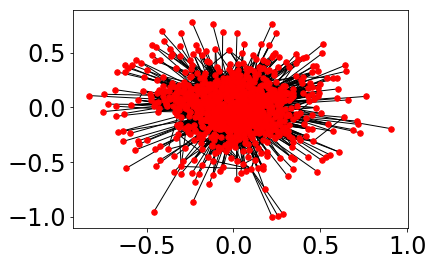

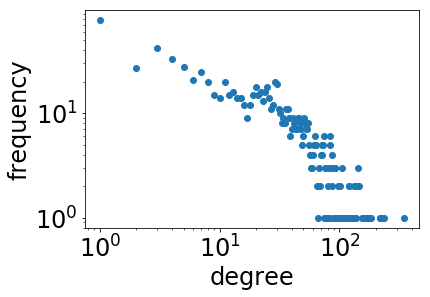

In [80]:
##################################################################################################################
####################-------------------Get Parameter of real Graph-----------------------#########################
##################################################################################################################

#Assumption:
#DiGraph is Undirected Graph, no Multigraph, connected

import time

#Plot real model
G = nx.Graph()
for item in dict_edges:
    node1=item[0]
    node2=item[1]
    G.add_edge(node1, node2)
nx.set_node_attributes(G,dict_attrib,'department')
start_time = time.time()
print("---------------------")
nb_of_nodes=G.number_of_nodes()
G = max(nx.connected_component_subgraphs(G), key=len)

print('avg shortest path',nx.average_shortest_path_length(G))
print('number of nodes biggest subgraph',G.number_of_nodes())
print('cluster coefficient:',nx.average_clustering(G))
print('number of edges',G.number_of_edges())
print('number of nodes all',nb_of_nodes)
print('number of nodes biggest subgraph',G.number_of_nodes())
print('maximum distance between any of the pairs of nodes:',nx.diameter(G))
print('assortiativity',nx.degree_assortativity_coefficient(G))
print("--- %s seconds ---" % (time.time() - start_time))

#Plot Graph
pos = nx.spring_layout(G) # set the positions of the nodes/edges/labels
nx.draw_networkx(G, pos=pos,node_size=30,with_labels=False) # draw everything but the edge labels
plt.savefig('Figures/spring_plot_Real.png')
plt.show()

##################################################################################################################
####################-------------------Plot Power Law (Real Graph)-----------------------#########################
##################################################################################################################

import collections

##Plot Power Law distribution
distr_list=list()
for item in G.degree():
    distr_list.append(item[1])
distr_list=sorted(distr_list, reverse = True)
counter=collections.Counter(distr_list)
frequency=counter.values()
degree=counter.keys()
plt.xlabel('degree')
plt.ylabel('frequency')
plt.loglog(degree, frequency,marker='o',linestyle='None')
plt.savefig('Figures/deg_real.png')
##################################################################################################################
#Result: Power Law Distribution, Small-world property, Disassortiative,19 isolated nodes

---------------------
avg shortest path 2.2538524109101017
number of nodes biggest subgraph 986
cluster coefficient: 0.08552340555255566
number of edges 16473
number of nodes all 986
number of nodes biggest subgraph 986
maximum distance between any of the pairs of nodes: 3
assortiativity -0.014375143991479414
--- 34.7426221370697 seconds ---


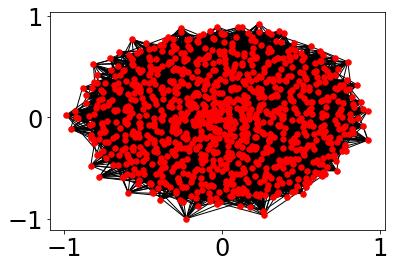

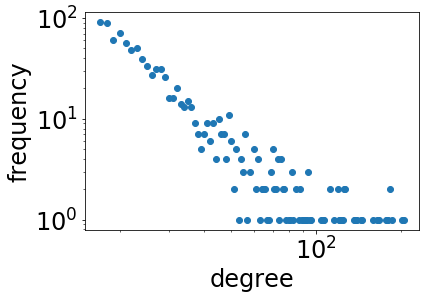

In [81]:
##################################################################################################################
######################-------------------Get Parameter of BA-Model-----------------------#########################
##################################################################################################################
#https://yoyoinwanderland.github.io/2017/08/08/Community-Detection-in-Python/

#Goal: have similar Parameter as real Graph
#Assumptions: undirected graph, connected

#Create Graph
n=986
m=17 #nb of edges attach to new node
G=nx.barabasi_albert_graph(n, m, seed=None)

#Parameter Graph
print("---------------------")
start_time = time.time()
nb_of_nodes=G.number_of_nodes()
G = max(nx.connected_component_subgraphs(G), key=len)
print('avg shortest path',nx.average_shortest_path_length(G))
print('number of nodes biggest subgraph',G.number_of_nodes())
print('cluster coefficient:',nx.average_clustering(G))
print('number of edges',G.number_of_edges())
print('number of nodes all',nb_of_nodes)
print('number of nodes biggest subgraph',G.number_of_nodes())
print('maximum distance between any of the pairs of nodes:',nx.diameter(G))
print('assortiativity',nx.degree_assortativity_coefficient(G))
print("--- %s seconds ---" % (time.time() - start_time))

#Plot Graph
pos = nx.spring_layout(G) # set the positions of the nodes/edges/labels
nx.draw_networkx(G, pos=pos,node_size=30,with_labels=False) # draw everything but the edge labels
plt.savefig('Figures/spring_plot_BA.png')
plt.show()

##################################################################################################################
######################-------------------Plot Power Law (BA Model)-----------------------#########################
##################################################################################################################

distr_list=list()
for item in G.degree():
    distr_list.append(item[1])
distr_list=sorted(distr_list, reverse = True)

counter=collections.Counter(distr_list)
frequency=counter.values()
degree=counter.keys()
#print(counter.most_common(3))
plt.xlabel('degree')
plt.ylabel('frequency')
plt.loglog(degree, frequency,marker='o',linestyle='None')
plt.savefig('Figures/deg_BA.png')
plt.show()


---------------------
avg shortest path 2.35054828512886
number of nodes biggest subgraph 986
cluster coefficient: 0.24157132665566855
number of edges 17336
number of nodes all 986
number of nodes biggest subgraph 986
maximum distance between any of the pairs of nodes: 4
assortiativity -0.035457147851341506
--- 44.645307779312134 seconds ---


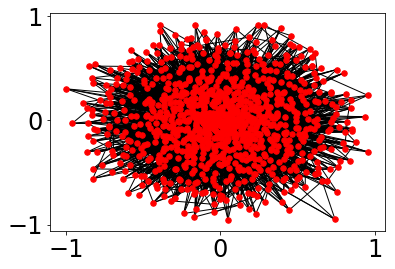

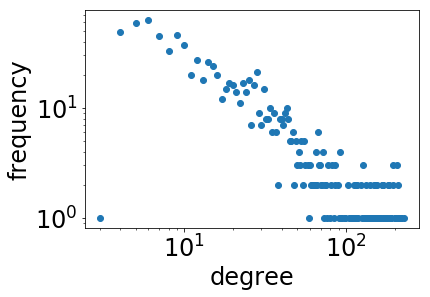

In [78]:
##################################################################################################################
###############-------------------Get Parameter of Extended BA-Model-----------------------#######################
##################################################################################################################
import time
#Create Graph
m=4 #nb of edges attach to new node
p=0.7 #0.5
q=0.1 #0.1
G=nx.extended_barabasi_albert_graph(n, m,p=p,q=q,seed=None)

#Parameter Graph
print("---------------------")
start_time = time.time()
nb_of_nodes=G.number_of_nodes()
G = max(nx.connected_component_subgraphs(G), key=len)
start_time = time.time()
print('avg shortest path',nx.average_shortest_path_length(G))
print('number of nodes biggest subgraph',G.number_of_nodes())
print('cluster coefficient:',nx.average_clustering(G))
print('number of edges',G.number_of_edges())
print('number of nodes all',nb_of_nodes)
print('number of nodes biggest subgraph',G.number_of_nodes())
print('maximum distance between any of the pairs of nodes:',nx.diameter(G))
print('assortiativity',nx.degree_assortativity_coefficient(G))
print("--- %s seconds ---" % (time.time() - start_time))


#Plot Graph
pos = nx.spring_layout(G) # set the positions of the nodes/edges/labels
nx.draw_networkx(G, pos=pos,node_size=30,with_labels=False) # draw everything but the edge labels
plt.savefig('Figures/spring_plot_Ext_BA.png')
plt.show()
##################################################################################################################
##################------------------Plot Power Law (Extended BA Model)-----------------------#####################
##################################################################################################################

distr_list=list()
for item in G.degree():
    distr_list.append(item[1])
distr_list=sorted(distr_list, reverse = True)

counter=collections.Counter(distr_list)
frequency=counter.values()
degree=counter.keys()
#print(counter.most_common(3))
plt.xlabel('degree')
plt.ylabel('frequency')
plt.loglog(degree, frequency,marker='o',linestyle='None')
plt.savefig('Figures/deg_Ext_BA.png')

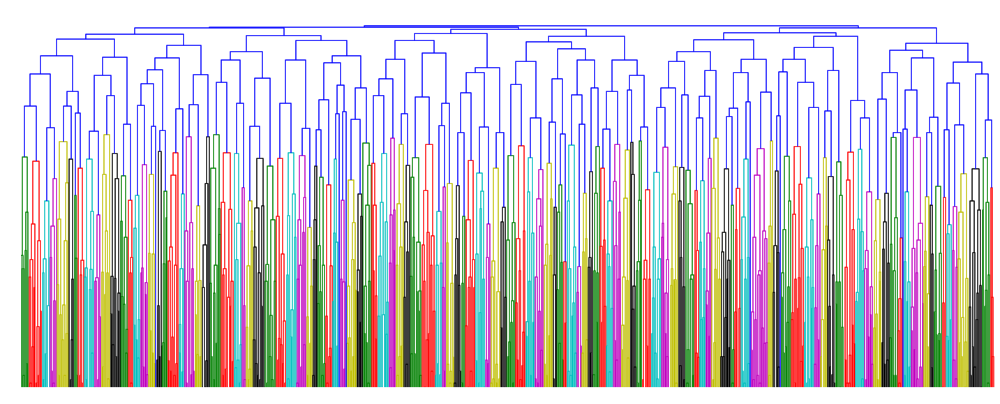

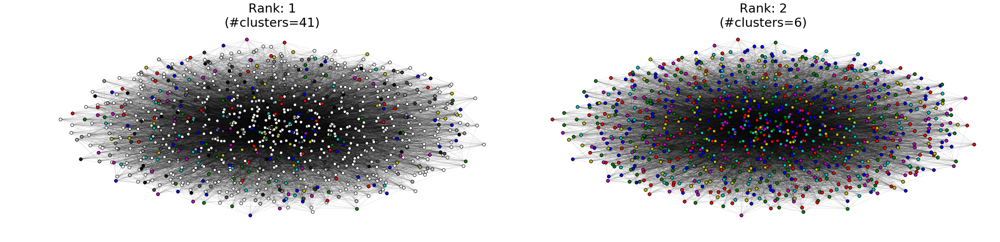

In [207]:
##################################################################################################################
############-------Hierachical Structure and Spectral Cluster (BA-Model)-----------------------###################
##################################################################################################################
#https://github.com/tbonald/paris
import numpy as np
import networkx as nx
from paris import paris
from louvain import louvain
from spectral import spectral
from utils import *

#Define Graph
m=17 #nb of edges attach to new node
n=968
G=nx.barabasi_albert_graph(n, m, seed=None)

#Compute the hierarchical clustering (as a dendrogram):
D = paris(G)
plot_dendrogram(D)

#Compute clustering
pos = nx.spring_layout(G)
plot_best_clusterings(G, D, 2, pos)

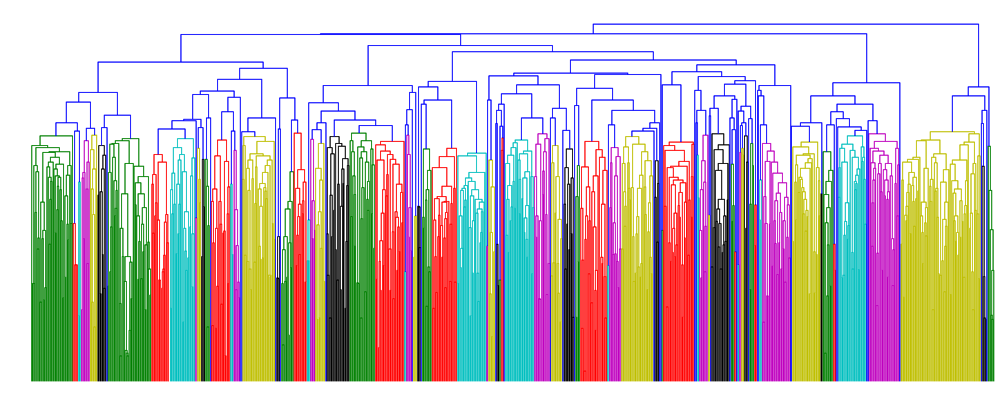

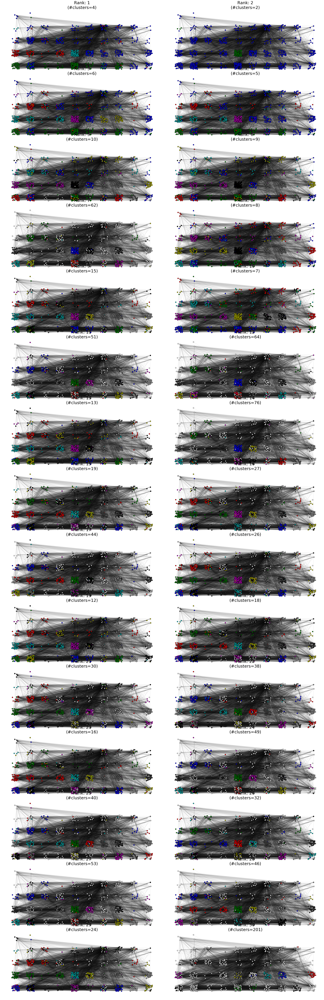

In [4]:
##################################################################################################################
############-------Hierachical Structure and Spectral Clustering (Real Model)------------------###################
##################################################################################################################
#https://github.com/tbonald/paris
import numpy as np
import networkx as nx
from paris import paris
from louvain import louvain
from spectral import spectral
from utils import *
import random

#Define Graph
G = nx.Graph()
for item in dict_edges:
    node1=item[0]
    node2=item[1]
    G.add_edge(node1, node2)
nx.set_node_attributes(G,dict_attrib,'department') #add attribute department
G = max(nx.connected_component_subgraphs(G), key=len)

#Compute the hierarchical clustering (as a dendrogram):
D = paris(G)
plot_dendrogram(D)
#Plot with departments (in geographical order)
x_and_y = nx.get_node_attributes(G,'department')
x_axis={}
y_axis={}
for key in x_and_y.keys():
    value=x_and_y[key]
    y_axis[key]=value//10+random.uniform(-0.25, 0.25)
    x_axis[key]=value%10+random.uniform(-0.25, 0.25)
pos = {u: (x_axis[u], y_axis[u]) for u in G.nodes()}
plot_best_clusterings(G, D, 30, pos)


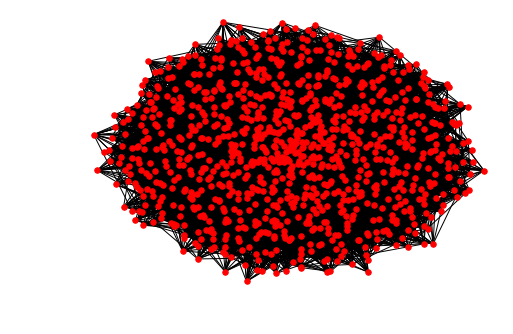

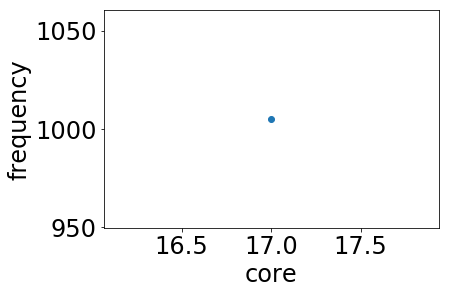

In [52]:
##################################################################################################################
#############################-------Coreness-Distribution (BA-Model)------------------############################
##################################################################################################################
import collections
import networkx as nx

#Define Graph
n=1005
m=17 #nb of edges attach to new node
G=nx.barabasi_albert_graph(n, m, seed=None)

#Plot Graph
pos=nx.spring_layout(G)
nx.draw(G,pos,node_size=30)
plt.show()


#calculate coreness value
core=nx.core_number(G)
distr_list=list()
for value in core.values():
    distr_list.append(value)
distr_list=sorted(distr_list, reverse = True)
counter=collections.Counter(distr_list)
frequency=counter.values()
coreness=counter.keys()
#print(counter.most_common(3))
plt.xlabel('core')
plt.ylabel('frequency')
plt.plot(coreness, frequency,marker='o',linestyle='None')

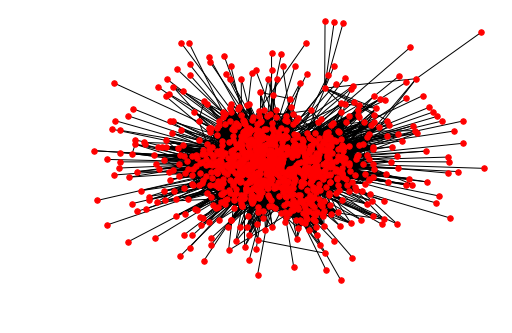

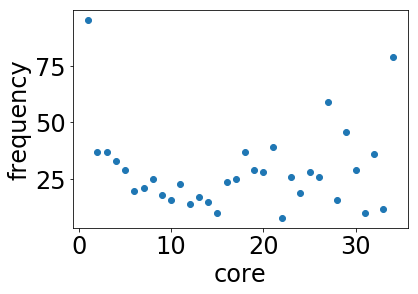

In [53]:
##################################################################################################################
#############################-------Coreness-Distribution (Real-Model)------------------##########################
##################################################################################################################
#Assumption:remove self loops and undirected graph and biggest subgraph (to make picture more beautiful)

import collections
import networkx as nx

#Define Graph
G = nx.Graph()
for item in dict_edges:
    node1=item[0]
    node2=item[1]
    G.add_edge(node1, node2)
nx.set_node_attributes(G,dict_attrib,'department') #add attribute department
G = max(nx.connected_component_subgraphs(G), key=len)
G.remove_edges_from(nx.selfloop_edges(G))    

#Plot Graph
pos=nx.spring_layout(G)
nx.draw(G,pos,node_size=30)
plt.show()


#calculate coreness value
core=nx.core_number(G)
distr_list=list()
for value in core.values():
    distr_list.append(value)
distr_list=sorted(distr_list, reverse = True)
counter=collections.Counter(distr_list)
frequency=counter.values()
coreness=counter.keys()
#print(counter.most_common(3))
plt.xlabel('core')
plt.ylabel('frequency')
plt.plot(coreness, frequency,marker='o',linestyle='None')

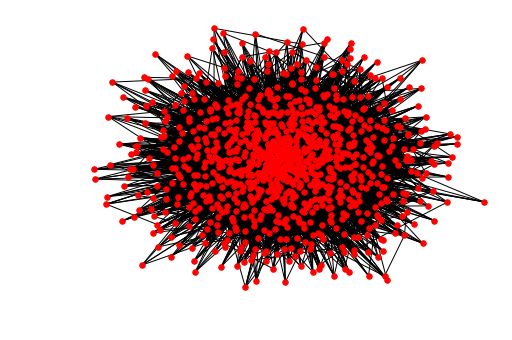

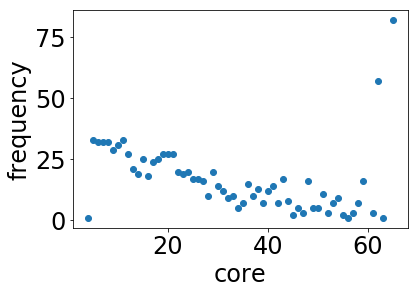

In [56]:
##################################################################################################################
######################-------Coreness-Distribution (Extended BA-Model)------------------##########################
##################################################################################################################
#Assumption:remove self loops and undirected graph and biggest subgraph (to make picture more beautiful)

import collections
import networkx as nx


#Create Graph
m=5 #nb of edges attached to new node
p=0.7 #0.5
q=0.15 #0.1
G=nx.extended_barabasi_albert_graph(n, m,p=p,q=q,seed=None)
G = max(nx.connected_component_subgraphs(G), key=len)
G.remove_edges_from(nx.selfloop_edges(G))    

#Plot Graph
pos=nx.spring_layout(G)
nx.draw(G,pos,node_size=30)
plt.show()


#calculate coreness value
core=nx.core_number(G)
distr_list=list()
for value in core.values():
    distr_list.append(value)
distr_list=sorted(distr_list, reverse = True)
counter=collections.Counter(distr_list)
frequency=counter.values()
coreness=counter.keys()
#print(counter.most_common(3))
plt.xlabel('core')
plt.ylabel('frequency')
plt.plot(coreness, frequency,marker='o',linestyle='None')

In [ ]:
#https://www.nature.com/articles/srep32558

init attachment_preference [0]
a_prob 0.4452271263345683
attachment_preference [0, 0, 1, 1]
a_prob 0.01658973701154476
attachment_preference [0, 0, 1, 1, 1, 2, 2]
a_prob 0.22855733728503858
attachment_preference [0, 0, 1, 1, 1, 2, 2, 0, 2]
a_prob 0.4309373744819528
attachment_preference [0, 0, 1, 1, 1, 2, 2, 0, 2, 0, 3, 3]
a_prob 0.29985754780396356
attachment_preference [0, 0, 1, 1, 1, 2, 2, 0, 2, 0, 3, 3, 1, 3]
a_prob 0.17612819501555432
attachment_preference [0, 0, 1, 1, 1, 2, 2, 0, 2, 0, 3, 3, 1, 3, 3, 2]
a_prob 0.6568711853500008
attachment_preference [0, 0, 1, 1, 1, 2, 2, 0, 2, 0, 3, 3, 1, 3, 3, 2, 0, 4, 4]
[(3, 3), (4, 1), (1, 1)]


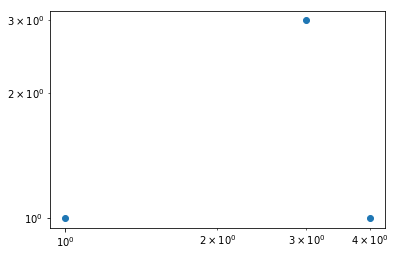

[(3, 4), (1, 1)]


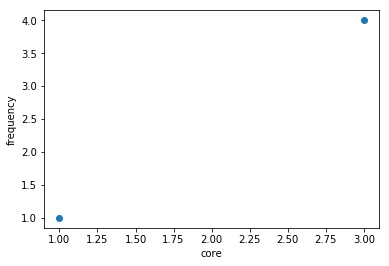

C:\ProgramData\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


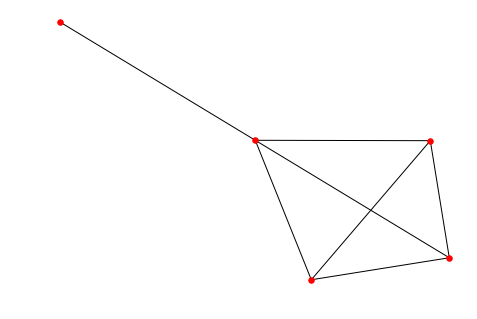

In [403]:
##################################################################################################################
###############-------------------------Modified Extended BA-Model-------------------------#######################
##################################################################################################################
n=5
m=1
p=0.3
q=0.3
import itertools
import math
import networkx as nx
from networkx.utils import py_random_state

def _random_subset(seq, m, rng):
    """ Return m unique elements from seq.

    This differs from random.sample which can return repeated
    elements if seq holds repeated elements.

    Note: rng is a random.Random or numpy.random.RandomState instance.
    """
    targets = set()
    while len(targets) < m:
        x = rng.choice(seq)
        targets.add(x)
    return targets


@py_random_state(4)
def extended_barabasi_albert_graph(n, m, p, q, seed=None):
    """Returns an extended Barabási–Albert model graph.

    An extended Barabási–Albert model graph is a random graph constructed
    using preferential attachment. The extended model allows new edges,
    rewired edges or new nodes. Based on the probabilities $p$ and $q$
    with $p + q < 1$, the growing behavior of the graph is determined as:

    1) With $p$ probability, $m$ new edges are added to the graph,
    starting from randomly chosen existing nodes and attached preferentially at the other end.

    2) With $q$ probability, $m$ existing edges are rewired
    by randomly choosing an edge and rewiring one end to a preferentially chosen node.

    3) With $(1 - p - q)$ probability, $m$ new nodes are added to the graph
    with edges attached preferentially.

    When $p = q = 0$, the model behaves just like the Barabási–Alber mo

    Parameters
    ----------
    n : int
        Number of nodes
    m : int
        Number of edges with which a new node attaches to existing nodes
    p : float
        Probability value for adding an edge between existing nodes. p + q < 1
    q : float
        Probability value of rewiring of existing edges. p + q < 1
    seed : integer, random_state, or None (default)
        Indicator of random number generation state.
        See :ref:`Randomness<randomness>`.

    Returns
    -------
    G : Graph

    Raises
    ------
    NetworkXError
        If `m` does not satisfy ``1 <= m < n`` or ``1 >= p + q``

    References
    ----------
    .. [1] Albert, R., & Barabási, A. L. (2000)
       Topology of evolving networks: local events and universality
       Physical review letters, 85(24), 5234.
    """
    if m < 1 or m >= n:
        msg = "Extended Barabasi-Albert network needs m>=1 and m<n, m=%d, n=%d"
        raise nx.NetworkXError(msg % (m, n))
    if p + q >= 1:
        msg = "Extended Barabasi-Albert network needs p + q <= 1, p=%d, q=%d"
        raise nx.NetworkXError(msg % (p, q))

    # Add m initial nodes (m0 in barabasi-speak)
    G = nx.empty_graph(m)

    # List of nodes to represent the preferential attachment random selection.
    # At the creation of the graph, all nodes are added to the list
    # so that even nodes that are not connected have a chance to get selected,
    # for rewiring and adding of edges.
    # With each new edge, nodes at the ends of the edge are added to the list.
    attachment_preference = []
    attachment_preference.extend(range(m))
    print('init attachment_preference',attachment_preference)
    # Start adding the other n-m nodes. The first node is m.
    new_node = m
    while new_node < n:
        a_probability = seed.random()
        print('a_prob',a_probability)

        # Total number of edges of a Clique of all the nodes
        clique_degree = len(G) - 1
        clique_size = (len(G) * clique_degree) / 2

        # Adding m new edges, if there is room to add them
        if a_probability < p and G.size() <= clique_size - m:
            # Select the nodes where an edge can be added
            elligible_nodes = [nd for nd, deg in G.degree()
                               if deg < clique_degree]
            for i in range(m):
                # Choosing a random source node from elligible_nodes
                src_node = seed.choice(elligible_nodes)

                # Picking a possible node that is not 'src_node' or
                # neighbor with 'src_node', with preferential attachment
                prohibited_nodes = list(G[src_node])
                prohibited_nodes.append(src_node)
                # This will raise an exception if the sequence is empty
                dest_node = seed.choice([nd for nd in attachment_preference
                                           if nd not in prohibited_nodes])
                # Adding the new edge
                G.add_edge(src_node, dest_node)

                # Appending both nodes to add to their preferential attachment
                attachment_preference.append(src_node)
                attachment_preference.append(dest_node)

                # Adjusting the elligible nodes. Degree may be saturated.
                if G.degree(src_node) == clique_degree:
                    elligible_nodes.remove(src_node)
                if G.degree(dest_node) == clique_degree \
                        and dest_node in elligible_nodes:
                    elligible_nodes.remove(dest_node)

        # Rewiring m edges, if there are enough edges
        elif p <= a_probability < (p + q) and m <= G.size() < clique_size:
            # Selecting nodes that have at least 1 edge but that are not
            # fully connected to ALL other nodes (center of star).
            # These nodes are the pivot nodes of the edges to rewire
            elligible_nodes = [nd for nd, deg in G.degree()
                               if 0 < deg < clique_degree]
            for i in range(m):
                # Choosing a random source node
                node = seed.choice(elligible_nodes)

                # The available nodes do have a neighbor at least.
                neighbor_nodes = list(G[node])

                # Choosing the other end that will get dettached
                src_node = seed.choice(neighbor_nodes)

                # Picking a target node that is not 'node' or
                # neighbor with 'node', with preferential attachment
                neighbor_nodes.append(node)
                dest_node = seed.choice([nd for nd in attachment_preference
                                           if nd not in neighbor_nodes])
                # Rewire
                G.remove_edge(node, src_node)
                #1
                G.add_edge(node, dest_node)

                # Adjusting the preferential attachment list
                attachment_preference.remove(src_node)
                attachment_preference.append(dest_node)

                # Adjusting the elligible nodes.
                # nodes may be saturated or isolated.
                if G.degree(src_node) == 0 and src_node in elligible_nodes:
                    elligible_nodes.remove(src_node)
                if dest_node in elligible_nodes:
                    if G.degree(dest_node) == clique_degree:
                        elligible_nodes.remove(dest_node)
                else:
                    if G.degree(dest_node) == 1:
                        elligible_nodes.append(dest_node)

        # Adding new node with m edges
        else:
            # Select the edges' nodes by preferential attachment
            targets = _random_subset(attachment_preference, m, seed)
            G.add_edges_from(zip([new_node] * m, targets))

            # Add one node to the list for each new edge just created.
            attachment_preference.extend(targets)
            # The new node has m edges to it, plus itself: m + 1
            attachment_preference.extend([new_node] * (m + 1))
            new_node += 1
        print('attachment_preference',attachment_preference)
    return G


G=extended_barabasi_albert_graph(n, m, p, q, seed=None)

##Plot Power Law
distr_list=list()
for item in G.degree():
    distr_list.append(item[1])
distr_list=sorted(distr_list, reverse = True)

counter=collections.Counter(distr_list)
frequency=counter.values()
degree=counter.keys()
print(counter.most_common(3))
plt.loglog(degree, frequency,marker='o',linestyle='None')
plt.show()
import collections

#Plot core vs frequency
core=nx.core_number(G)
distr_list=list()
for value in core.values():
    distr_list.append(value)
distr_list=sorted(distr_list, reverse = True)
counter=collections.Counter(distr_list)
frequency=counter.values()
degree=counter.keys()
print(counter.most_common(3))
plt.xlabel('core')
plt.ylabel('frequency')
plt.plot(degree, frequency,marker='o',linestyle='None')
plt.show()

#Plot Graph
pos=nx.spring_layout(G)
nx.draw(G,pos,node_size=30)
plt.show()




In [100]:
#################################################################################################################
###############------------Parameteroptimization Extended BA-Model-------------------------#######################
##################################################################################################################

from sklearn.metrics import mean_squared_error
import time

#########################################################################################################
#Goal attributes of the graph:
avg_l=2.5869#avg shortest path 2.58693
c=0.40705#cluster coefficient: 0.40705044751953817
e=16687 #number of edges 16687
dist=7 #maximum distance between any of the pairs of nodes: 7
Y_true=[avg_l,c,e,dist]
#########################################################################################################
n=968
#Find best values for M,p,q
m_range=np.arange(3, 10,1)
p_range=np.arange(0.1, 0.8,0.15)
q_range=np.arange(0.1,0.8, 0.15)
MSE_dict={}

Low_MSE=1e400

print("---------------------")
k=0
for m in m_range:
        for i,p in enumerate (p_range,0):
            for j,q in enumerate (q_range,0):
                start_time = time.time()
                #what ever loop you want to execute
                if p_range[i]+q_range[j]>=0.95 or m>=n: #only values which fullfil p+q<1
                    continue
                print('m:',m,' p:',p_range[i],' q:',q_range[j])
                G=nx.extended_barabasi_albert_graph(n, m,p=p,q=q,seed=None)
                G = max(nx.connected_component_subgraphs(G), key=len) #only connected graphs possible to evaluate
                avg_l_temp=nx.average_shortest_path_length(G) #avg shortest path 2.58693
                c_temp=nx.average_clustering(G)#cluster coefficient: 0.40705044751953817
                e_temp=G.number_of_edges() #number of edges 16687
                dist_temp=nx.diameter(G) #maximum distance between any of the pairs of nodes: 7
                #Normalize data
                Y_pred=[(avg_l_temp-avg_l)/avg_l,(c_temp-c)/c,2*(e_temp-e)/e,(dist_temp-dist)/dist] #number of edges even more important

                print('avg shortest path',nx.average_shortest_path_length(G))
                print('number of nodes biggest subgraph',G.number_of_nodes())
                print('cluster coefficient:',nx.average_clustering(G))
                print('maximum distance between any of the pairs of nodes:',nx.diameter(G))
                print('number of edges',G.number_of_edges())
                Y_true=[0,0,0,0]
                MSE=mean_squared_error(Y_true,Y_pred)
                print('MSE:',MSE)
                if MSE<=Low_MSE:
                    Low_MSE=MSE
                    G_max=G
                execution_time=(time.time() - start_time)
                MSE_dict[k]=[m, p, q, MSE, execution_time] 
                k+=1
                print("-------- %s seconds --------" % (execution_time))
   
print("--------------------------")
print('Lowest_MSE:',Low_MSE)
'''
n=1000
############################################
m_array= #nb of edges attach to new node
p=0.3
q=0.1 #0.1
start_time = time.time()
G=nx.extended_barabasi_albert_graph(n, m,p=p,q=q,seed=None)
print('avg shortest path',nx.average_shortest_path_length(G))
print('number of nodes biggest subgraph',G.number_of_nodes())
print('cluster coefficient:',nx.average_clustering(G))
print('number of edges',G.number_of_edges())
print('maximum distance between any of the pairs of nodes:',nx.diameter(G))
print("--- %s seconds ---" % (time.time() - start_time))
'''
f = open("EBA.txt","w")
f.write( str(MSE_dict) )
f.close()

---------------------
m: 3  p: 0.1  q: 0.1


KeyboardInterrupt: 

In [12]:
#################################################################################################################
###############------------Definition Optimized Extended BA-Model-------------------------#######################
#################################################################################################################

#changed from https://www.nature.com/articles/srep32558

import itertools
import math
import networkx as nx
from networkx.utils import py_random_state
from random import randint

def _random_subset(seq, m, rng):
    """ Return m unique elements from seq.

    This differs from random.sample which can return repeated
    elements if seq holds repeated elements.

    Note: rng is a random.Random or numpy.random.RandomState instance.
    """
    targets = set()
    while len(targets) < m:
        x = rng.choice(seq)
        targets.add(x)
    return targets


@py_random_state(4)
def extended_barabasi_albert_graph(n, m, p, q, seed=None):
    """Returns an extended Barabási–Albert model graph.

    An extended Barabási–Albert model graph is a random graph constructed
    using preferential attachment. The extended model allows new edges,
    rewired edges or new nodes. Based on the probabilities $p$ and $q$
    with $p + q < 1$, the growing behavior of the graph is determined as:

    1) With $p$ probability, $m$ new edges are added to the graph,
    starting from randomly chosen existing nodes and attached preferentially at the other end.

    2) With $q$ probability, $m$ existing edges are rewired
    by randomly choosing an edge and rewiring one end to a preferentially chosen node.

    3) With $(1 - p - q)$ probability, $m$ new nodes are added to the graph
    with edges attached preferentially.

    When $p = q = 0$, the model behaves just like the Barabási–Alber mo

    Parameters
    ----------
    n : int
        Number of nodes
    m : int
        Number of edges with which a new node attaches to existing nodes
    p : float
        Probability value for adding an edge between existing nodes. p + q < 1
    q : float
        Probability value of rewiring of existing edges. p + q < 1
    seed : integer, random_state, or None (default)
        Indicator of random number generation state.
        See :ref:`Randomness<randomness>`.

    Returns
    -------
    G : Graph

    Raises
    ------
    NetworkXError
        If `m` does not satisfy ``1 <= m < n`` or ``1 >= p + q``

    References
    ----------
    .. [1] Albert, R., & Barabási, A. L. (2000)
       Topology of evolving networks: local events and universality
       Physical review letters, 85(24), 5234.
    """
    if m < 1 or m >= n:
        msg = "Extended Barabasi-Albert network needs m>=1 and m<n, m=%d, n=%d"
        raise nx.NetworkXError(msg % (m, n))
    if p + q >= 1:
        msg = "Extended Barabasi-Albert network needs p + q <= 1, p=%d, q=%d"
        raise nx.NetworkXError(msg % (p, q))

    # Add m initial nodes (m0 in barabasi-speak)
    G = nx.empty_graph(m)

    # List of nodes to represent the preferential attachment random selection.
    # At the creation of the graph, all nodes are added to the list
    # so that even nodes that are not connected have a chance to get selected,
    # for rewiring and adding of edges.
    # With each new edge, nodes at the ends of the edge are added to the list.
    attachment_preference = []
    attachment_preference.extend(range(m))
    #print('init attachment_preference',attachment_preference)
    # Start adding the other n-m nodes. The first node is m.
    new_node = m
    while new_node < n:
        a_probability = seed.random()
        #print('a_prob',a_probability)

        # Total number of edges of a Clique of all the nodes
        clique_degree = len(G) - 1
        clique_size = (len(G) * clique_degree) / 2

        # Adding m new edges, if there is room to add them
        if a_probability < p and G.size() <= clique_size - m:
            # Select the nodes where an edge can be added
            elligible_nodes = [nd for nd, deg in G.degree()
                               if deg < clique_degree]
            for i in range(m):
                # Choosing a random source node from elligible_nodes
                src_node = seed.choice(elligible_nodes)

                # Picking a possible node that is not 'src_node' or
                # neighbor with 'src_node', with preferential attachment
                prohibited_nodes = list(G[src_node])
                prohibited_nodes.append(src_node)
                # This will raise an exception if the sequence is empty
                dest_node = seed.choice([nd for nd in attachment_preference
                                           if nd not in prohibited_nodes])
                # Adding the new edge
                G.add_edge(src_node, dest_node)

                # Appending both nodes to add to their preferential attachment
                attachment_preference.append(src_node)
                attachment_preference.append(dest_node)

                # Adjusting the elligible nodes. Degree may be saturated.
                if G.degree(src_node) == clique_degree:
                    elligible_nodes.remove(src_node)
                if G.degree(dest_node) == clique_degree \
                        and dest_node in elligible_nodes:
                    elligible_nodes.remove(dest_node)

        # Rewiring m edges, if there are enough edges
        elif p <= a_probability < (p + q) and m <= G.size() < clique_size:
            # Selecting nodes that have at least 1 edge but that are not
            # fully connected to ALL other nodes (center of star).
            # These nodes are the pivot nodes of the edges to rewire
            elligible_nodes = [nd for nd, deg in G.degree()
                               if 0 < deg < clique_degree]
            for i in range(m):
                # Choosing a random source node
                node = seed.choice(elligible_nodes)

                # The available nodes do have a neighbor at least.
                neighbor_nodes = list(G[node])

                # Choosing the other end that will get dettached
                src_node = seed.choice(neighbor_nodes)

                # Picking a target node that is not 'node' or
                # neighbor with 'node', with preferential attachment
                neighbor_nodes.append(node)
                dest_node = seed.choice([nd for nd in attachment_preference
                                           if nd not in neighbor_nodes])
                # Rewire
                G.remove_edge(node, src_node)
                G.add_edge(node, dest_node)

                # Adjusting the preferential attachment list
                attachment_preference.remove(src_node)
                attachment_preference.append(dest_node)

                # Adjusting the elligible nodes.
                # nodes may be saturated or isolated.
                if G.degree(src_node) == 0 and src_node in elligible_nodes:
                    elligible_nodes.remove(src_node)
                if dest_node in elligible_nodes:
                    if G.degree(dest_node) == clique_degree:
                        elligible_nodes.remove(dest_node)
                else:
                    if G.degree(dest_node) == 1:
                        elligible_nodes.append(dest_node)

        # Adding new node with m edges
        else:
            '''
            # Select the edges' nodes by preferential attachment
            print(attachment_preference)
            targets = _random_subset(attachment_preference, m, seed)
            G.add_edges_from(zip([new_node] * m, targets))

            # Add one node to the list for each new edge just created.
            attachment_preference.extend(targets)
            # The new node has m edges to it, plus itself: m + 1
            attachment_preference.extend([new_node] * (m + 1))
            new_node += 1
            '''
            # Select the edges' nodes by preferential attachment
            #targets = _random_subset(attachment_preference, m, seed)
            ################################New Code#####################################
            #Connect prefered to neighbor nodes
            targets = set()
            #print('attachment_preference',attachment_preference)
            node_src=new_node
            #print('source node:',node_src)
            neighbor_nodes_list=[]
            m=randint(1, m) #randomized
            #print(m)
            while len(targets) < m:
                #Choose between attachment list and neighbours (with high attachment)
                b_probability = seed.random()
                #print('b_probability',b_probability)
                if b_probability<0.1: #choose from attachment
                    node_trg=seed.choice(attachment_preference)
                    len_tar=len(targets)
                    targets.add(node_trg)
                    if len_tar<len(targets): #actually a new node
                        neighbor_nodes = list(G[node_trg])
                        neighbor_nodes_list.extend(neighbor_nodes)
                        #print('neighbor_nodes_list:',neighbor_nodes_list)
                else:
                    #check with attachment list
                    listi=[]
                    for val1 in neighbor_nodes_list:
                        for val2 in attachment_preference:
                            if val1==val2:
                                listi.append(val2)
                    if listi==[]: #check if neighbour exist
                        continue
                    else:
                        node_trg=seed.choice(listi)
                        len_tar=len(targets)
                        targets.add(node_trg)
                        if len_tar<len(targets): #actually a new node
                            #Add to neighbours list
                            neighbor_nodes = list(G[node_trg]) 
                            neighbor_nodes_list.extend(neighbor_nodes)
                        #print('neighbor_nodes_list:',neighbor_nodes_list)
            G.add_edges_from(zip([node_src] * m, targets))
            attachment_preference.extend(targets)
            attachment_preference.extend([node_src]*(m+1))   
            new_node+=1
            ###############################################################################
            
    return G

In [213]:
#################################################################################################################
###############------------Definition Optimized2 Extended BA-Model-------------------------#######################
#################################################################################################################

#changed from https://www.nature.com/articles/srep32558

import itertools
import math
import networkx as nx
from networkx.utils import py_random_state
from random import randint

def _random_subset(seq, m, rng):
    """ Return m unique elements from seq.

    This differs from random.sample which can return repeated
    elements if seq holds repeated elements.

    Note: rng is a random.Random or numpy.random.RandomState instance.
    """
    targets = set()
    while len(targets) < m:
        x = rng.choice(seq)
        targets.add(x)
    return targets


@py_random_state(5)
def modified_extended_barabasi_albert_graph(n, m, p, q, b, seed=None):
    """Returns an extended Barabási–Albert model graph.

    An extended Barabási–Albert model graph is a random graph constructed
    using preferential attachment. The extended model allows new edges,
    rewired edges or new nodes. Based on the probabilities $p$ and $q$
    with $p + q < 1$, the growing behavior of the graph is determined as:

    1) With $p$ probability, $m$ new edges are added to the graph,
    starting from randomly chosen existing nodes and attached preferentially at the other end.

    2) With $q$ probability, $m$ existing edges are rewired
    by randomly choosing an edge and rewiring one end to a preferentially chosen node.

    3) With $(1 - p - q)$ probability, $m$ new nodes are added to the graph
    with edges attached preferentially.

    When $p = q = 0$, the model behaves just like the Barabási–Alber mo

    Parameters
    ----------
    n : int
        Number of nodes
    m : int
        Number of edges with which a new node attaches to existing nodes
    p : float
        Probability value for adding an edge between existing nodes. p + q < 1
    q : float
        Probability value of rewiring of existing edges. p + q < 1
    seed : integer, random_state, or None (default)
        Indicator of random number generation state.
        See :ref:`Randomness<randomness>`.

    Returns
    -------
    G : Graph

    Raises
    ------
    NetworkXError
        If `m` does not satisfy ``1 <= m < n`` or ``1 >= p + q``

    References
    ----------
    .. [1] Albert, R., & Barabási, A. L. (2000)
       Topology of evolving networks: local events and universality
       Physical review letters, 85(24), 5234.
    """
    if m < 1 or m >= n:
        msg = "Extended Barabasi-Albert network needs m>=1 and m<n, m=%d, n=%d"
        raise nx.NetworkXError(msg % (m, n))
    if p + q >= 1:
        msg = "Extended Barabasi-Albert network needs p + q <= 1, p=%d, q=%d"
        raise nx.NetworkXError(msg % (p, q))

    # Add m initial nodes (m0 in barabasi-speak)
    G = nx.empty_graph(m)

    # List of nodes to represent the preferential attachment random selection.
    # At the creation of the graph, all nodes are added to the list
    # so that even nodes that are not connected have a chance to get selected,
    # for rewiring and adding of edges.
    # With each new edge, nodes at the ends of the edge are added to the list.
    attachment_preference = []
    attachment_preference.extend(range(m))
    #print('init attachment_preference',attachment_preference)
    # Start adding the other n-m nodes. The first node is m.
    new_node = m
    
    while new_node < n:
        a_probability = seed.random()
        #print('a_prob',a_probability)

        # Total number of edges of a Clique of all the nodes
        clique_degree = len(G) - 1
        clique_size = (len(G) * clique_degree) / 2

        # Adding m new edges, if there is room to add them
        if a_probability < p and G.size() <= clique_size - m:
            # Select the nodes where an edge can be added
            elligible_nodes = [nd for nd, deg in G.degree()
                               if deg < clique_degree]
            for i in range(m):
                # Choosing a random source node from elligible_nodes
                src_node = seed.choice(elligible_nodes)

                # Picking a possible node that is not 'src_node' or
                # neighbor with 'src_node', with preferential attachment
                prohibited_nodes = list(G[src_node])
                prohibited_nodes.append(src_node)
                # This will raise an exception if the sequence is empty
                ################################################################
                #dest_node = seed.choice([nd for nd in attachment_preference if nd not in prohibited_nodes])
                ################################################################
                
                #Choose between attachment list and neighbours (with high attachment)
                neighbor_nodes_set=set()
                b_probability = seed.random()
                                
                if b_probability<b: #choose from attachment
                    dest_node=seed.choice([nd for nd in attachment_preference if nd not in prohibited_nodes])
                else:
                    att_neigh_list=[]
                    prohibited_nodes_set=(neighbor_nodes_set|set(prohibited_nodes))
                    intersection_set=set(attachment_preference)&prohibited_nodes_set
                    att_neigh_list=[value for value in attachment_preference if value in intersection_set]
                    
                    
                    if att_neigh_list==[]: #check if neighbour exist
                        dest_node=seed.choice([nd for nd in attachment_preference if nd not in prohibited_nodes])
                    else:
                        dest_node=seed.choice(att_neigh_list) 
                
                ################################################################
                # Adding the new edge
                G.add_edge(src_node, dest_node)

                # Appending both nodes to add to their preferential attachment
                attachment_preference.append(src_node)
                attachment_preference.append(dest_node)

                # Adjusting the elligible nodes. Degree may be saturated.
                if G.degree(src_node) == clique_degree:
                    elligible_nodes.remove(src_node)
                if G.degree(dest_node) == clique_degree \
                        and dest_node in elligible_nodes:
                    elligible_nodes.remove(dest_node)

        # Rewiring m edges, if there are enough edges
        elif p <= a_probability < (p + q) and m <= G.size() < clique_size:
            # Selecting nodes that have at least 1 edge but that are not
            # fully connected to ALL other nodes (center of star).
            # These nodes are the pivot nodes of the edges to rewire
            elligible_nodes = [nd for nd, deg in G.degree()
                               if 0 < deg < clique_degree]
            for i in range(m):
                # Choosing a random source node
                node = seed.choice(elligible_nodes)

                # The available nodes do have a neighbor at least.
                neighbor_nodes = list(G[node])

                # Choosing the other end that will get dettached
                src_node = seed.choice(neighbor_nodes)

                # Picking a target node that is not 'node' or
                # neighbor with 'node', with preferential attachment
                neighbor_nodes.append(node)
                ###################################################################
                #NEWCODE
                #dest_node = seed.choice([nd for nd in attachment_preference if nd not in neighbor_nodes])
                ###################################################################
                #Choose between attachment list and neighbours (with high attachment)
                neighbor_nodes_set=set()
                b_probability = seed.random()
                                
                if b_probability<b: #choose from attachment
                    dest_node=seed.choice([nd for nd in attachment_preference if nd not in neighbor_nodes])
                else:
                    att_neigh_list=[]
                    neighbor_nodes_set=(neighbor_nodes_set|set(neighbor_nodes))
                    intersection_set=set(attachment_preference)&neighbor_nodes_set
                    att_neigh_list=[value for value in attachment_preference if value in intersection_set]
                    
                    
                    if att_neigh_list==[]: #check if neighbour exist
                            dest_node=seed.choice([nd for nd in attachment_preference if nd not in neighbor_nodes])
                    else:
                        dest_node=seed.choice(att_neigh_list) 
                ##################################################################
                # Rewire
                              
                G.remove_edge(node, src_node)
                #2
                G.add_edge(node, dest_node)

                # Adjusting the preferential attachment list
                attachment_preference.remove(src_node)
                attachment_preference.append(dest_node)

                # Adjusting the elligible nodes.
                # nodes may be saturated or isolated.
                if G.degree(src_node) == 0 and src_node in elligible_nodes:
                    elligible_nodes.remove(src_node)
                if dest_node in elligible_nodes:
                    if G.degree(dest_node) == clique_degree:
                        elligible_nodes.remove(dest_node)
                else:
                    if G.degree(dest_node) == 1:
                        elligible_nodes.append(dest_node)

        # Adding new node with m edges
        else:
            '''
            # Select the edges' nodes by preferential attachment
            print(attachment_preference)
            targets = _random_subset(attachment_preference, m, seed)
            G.add_edges_from(zip([new_node] * m, targets))

            # Add one node to the list for each new edge just created.
            attachment_preference.extend(targets)
            # The new node has m edges to it, plus itself: m + 1
            attachment_preference.extend([new_node] * (m + 1))
            new_node += 1
            '''
            # Select the edges' nodes by preferential attachment
            #targets = _random_subset(attachment_preference, m, seed)
            ################################New Code#####################################
            #Connect prefered to neighbor nodes
            targets = set()
            #print('attachment_preference',attachment_preference)
            node_src=new_node
            #print('source node:',node_src)
            #neighbor_nodes_list=[]
            neighbor_nodes_set= set()
            #neighbor_direct_list=[]
            #h=randint(1,m)
            h=m
            i=0
            #k=0
            #print(m)
            while len(targets) < h and i<2*h:
            #for i in range(h):
                #Choose between attachment list and neighbours (with high attachment)
                b_probability = seed.random()
                #print(node_src,b_probability)
                if b_probability<b: #choose from attachment
                    node_trg=seed.choice(attachment_preference)
                    len_tar=len(targets)
                    targets.add(node_trg)
                    if len_tar<len(targets): #actually a new node
                        neighbor_nodes = G[node_trg]
                        neighbor_nodes_set=(neighbor_nodes_set|set(neighbor_nodes))-targets
                else:
                    
                    #check with attachment list
                    att_neigh_list=[]
                    intersection_set=set(attachment_preference)&neighbor_nodes_set
                    att_neigh_list=[value for value in attachment_preference if value in intersection_set] 
                    #print(att_neigh_list)
                    if att_neigh_list==[]: #check if neighbour exist, if not use preferential attachment
                        node_trg=seed.choice(attachment_preference)
                        len_tar=len(targets)
                        targets.add(node_trg)
                        if len_tar<len(targets): #actually a new node
                            neighbor_nodes = G[node_trg]
                            neighbor_nodes_set=(neighbor_nodes_set|set(neighbor_nodes))-targets
                    else:
                        node_trg=seed.choice(att_neigh_list)
                        len_tar=len(targets)
                        targets.add(node_trg)
                        if len_tar<len(targets): #actually a new node
                            #Add to neighbours list
                            neighbor_nodes = G[node_trg]
                            neighbor_nodes_set=(neighbor_nodes_set|set(neighbor_nodes))-targets 
                        else:
                            node_trg=seed.choice(attachment_preference)
                            len_tar=len(targets)
                            targets.add(node_trg)
                            if len_tar<len(targets): #actually a new node
                                neighbor_nodes = G[node_trg]
                                neighbor_nodes_set=(neighbor_nodes_set|set(neighbor_nodes))-targets
                i+=1 
                #if (i==2*h):
                #    print("Max reached",k,len(targets))
                 #   k+=1
            ###############################################################################
            h=len(targets)
            G.add_edges_from(zip([node_src] * h, targets))
            attachment_preference.extend(targets)
            attachment_preference.extend([node_src]*(h+1))   
            new_node+=1
            
    return G

In [ ]:
#################################################################################################################
###############-------Parameteroptimization Optimized Extended BA-Model-------------------#######################
#################################################################################################################
from sklearn.metrics import mean_squared_error
import time

#Define Graph
#G=extended_barabasi_albert_graph(n, m, p, q, seed=None)
print("Start Modified Extended BA-Model Paramteroptimization")


#########################################################################################################
#Goal attributes of the graph:
avg_l=2.5869#avg shortest path 2.58693
c=0.40705#cluster coefficient: 0.40705044751953817
e=16687 #number of edges 16687
dist=7 #maximum distance between any of the pairs of nodes: 7
Y_true=[avg_l,c,e,dist]
#########################################################################################################

#Parameter Optimization
n=968
#n=300
#Find best values for M,p,q (m: 4  p: 0.7  q: 0.1=>MSE 0.101)
m_range=np.arange(4,8 ,1) #3, 10,1
p_range=np.arange(0.5, 0.8,0.15) #0.1, 0.8,0.15
q_range=np.arange(0.05,0.25, 0.5) #0.1, 0.8,0.15
b_range=np.arange(0.3,1.1,0.2) #0,1.1,0.1
#def modified_extended_barabasi_albert_graph(n, m, p, q,b, seed=None):
MSE_dict={}

Low_MSE=1e400

print("---------------------")
k=0
for m in m_range:
        for i,p in enumerate (p_range,0):
            for j,q in enumerate (q_range,0):
                for k,b in enumerate (b_range,0):
                    start_time = time.time()
                    #what ever loop you want to execute
                    if p_range[i]+q_range[j]>=0.95 or m>=n: #only values which fullfil p+q<1
                        continue
                    print('m:',m,' p:',p_range[i],' q:',q_range[j],' b:',b_range[k])
                    #########################################################################################
                    #G=extended_barabasi_albert_graph(n=n, m=m,p=p,q=q,seed=None)
                    G=modified_extended_barabasi_albert_graph(n=n, m=m, p=p, q=q,b=b,seed=None)
                    G = max(nx.connected_component_subgraphs(G), key=len) #only connected graphs possible to evaluate
                    G.remove_edges_from(nx.selfloop_edges(G))
                    #########################################################################################
                    avg_l_temp=nx.average_shortest_path_length(G) #avg shortest path 2.58693
                    c_temp=nx.average_clustering(G)#cluster coefficient: 0.40705044751953817
                    e_temp=G.number_of_edges() #number of edges 16687
                    dist_temp=nx.diameter(G) #maximum distance between any of the pairs of nodes: 7
                    #Normalize data
                    Y_pred=[(avg_l_temp-avg_l)/avg_l,(c_temp-c)/c,2*(e_temp-e)/e,(dist_temp-dist)/dist] #number of edges even more important

                    print('avg shortest path',nx.average_shortest_path_length(G))
                    print('number of nodes biggest subgraph',G.number_of_nodes())
                    print('cluster coefficient:',nx.average_clustering(G))
                    print('maximum distance between any of the pairs of nodes:',nx.diameter(G))
                    print('number of edges',G.number_of_edges())
                    Y_true=[0,0,0,0]
                    MSE=mean_squared_error(Y_true,Y_pred)
                    print('MSE:',MSE)
                    if MSE<=Low_MSE:
                        Low_MSE=MSE
                        G_max=G
                    execution_time=(time.time() - start_time)
                    MSE_dict[k]=[m, p, q, MSE, execution_time] 
                    k+=1
                    print("-------- %s seconds --------" % (execution_time))
   
print("--------------------------")
print('Lowest_MSE:',Low_MSE)

#Save results
f = open("Modified_EBA_Test3.txt","w")
f.write( str(MSE_dict) )
f.close()
########################################################################################################################
G=G_max

##Plot Power Law
import collections

#Plot core vs frequency
core=nx.core_number(G)
distr_list=list()
for value in core.values():
    distr_list.append(value)
distr_list=sorted(distr_list, reverse = True)
counter=collections.Counter(distr_list)
frequency=counter.values()
degree=counter.keys()
print(counter.most_common(3))
plt.xlabel('core')
plt.ylabel('frequency')
plt.plot(degree, frequency,marker='o',linestyle='None')
plt.savefig('Figures/deg_Mod_Ext_BA.png')
plt.show()

#Plot Graph
pos=nx.spring_layout(G)
nx.draw_networkx(G, pos=pos,node_size=30,with_labels=False) 
plt.savefig('Figures/spring_plot_Mod_Ext_BA.png')
plt.show()
G = max(nx.connected_component_subgraphs(G), key=len)
print('avg shortest path',nx.average_shortest_path_length(G))
print('number of nodes biggest subgraph',G.number_of_nodes())
print('cluster coefficient:',nx.average_clustering(G))
print('number of edges',G.number_of_edges())
print('maximum distance between any of the pairs of nodes:',nx.diameter(G))
print('assortiativity',nx.degree_assortativity_coefficient(G))

##################################################################################################################
##################------------------Plot Power Law (Modified Extended BA Model)-----------------------#####################
##################################################################################################################

distr_list=list()
for item in G.degree():
    distr_list.append(item[1])
distr_list=sorted(distr_list, reverse = True)

counter=collections.Counter(distr_list)
frequency=counter.values()
degree=counter.keys()
#print(counter.most_common(3))
plt.xlabel('degree')
plt.ylabel('frequency')
plt.loglog(degree, frequency,marker='o',linestyle='None')
plt.savefig('Figures/deg_Test_Modified_Ext_BA.png')

Start Modified Extended BA-Model Paramteroptimization
---------------------
m: 4  p: 0.5  q: 0.05  b: 0.3
avg shortest path 2.7766565823307876
number of nodes biggest subgraph 967
cluster coefficient: 0.3119819238111595
maximum distance between any of the pairs of nodes: 7
number of edges 3530
MSE: 0.63664815212785
-------- 34.372143030166626 seconds --------
m: 4  p: 0.5  q: 0.05  b: 0.5
avg shortest path 2.8628885451297785
number of nodes biggest subgraph 968
cluster coefficient: 0.20227301682471463
maximum distance between any of the pairs of nodes: 6
number of edges 4530
MSE: 0.6019765683356454
-------- 38.08066272735596 seconds --------
m: 4  p: 0.5  q: 0.05  b: 0.7
avg shortest path 2.831025066876341
number of nodes biggest subgraph 968
cluster coefficient: 0.16298774958317655
maximum distance between any of the pairs of nodes: 6
number of edges 5359
MSE: 0.5580446292856753
-------- 44.15348505973816 seconds --------
m: 4  p: 0.5  q: 0.05  b: 0.9000000000000001
avg shortest path 

In [ ]:
##################################################################################################################
############-------Hierachical Structure and Spectral Cluster (Modifed BA-Model)------------######################
##################################################################################################################
#https://github.com/tbonald/paris
import numpy as np
import networkx as nx
from paris import paris
from louvain import louvain
from spectral import spectral
from utils import *

#Compute the hierarchical clustering (as a dendrogram):
D = paris(G)
plot_dendrogram(D)

#Compute clustering
pos = nx.spring_layout(G)
plot_best_clusterings(G, D, 2, pos)

In [ ]:
#################################################################################################################
###############-------------------------Definition Local BA-Model-------------------------#######################
#################################################################################################################

#Code Basis is the Extended BA-Model (the implementation can be found in the following link)
#https://networkx.github.io/documentation/stable/_modules/networkx/generators/random_graphs.html

import itertools
import math
import networkx as nx
from networkx.utils import py_random_state
from random import randint

@py_random_state(5)
def local_barabasi_albert_graph(n, m, p, q, b, seed=None):
    """Returns an local Barabási–Albert model graph.

    An local Barabási–Albert model graph is a random graph constructed
    using preferential attachment. The extended model allows new edges,
    rewired edges or new nodes. Based on the probabilities $p$ and $q$
    with $p + q < 1$, the growing behavior of the graph is determined as:

    1) With $p$ probability, $m$ new edges are added to the graph,
    starting from randomly chosen existing nodes and attached preferentially at the other end.

    2) With $q$ probability, $m$ existing edges are rewired
    by randomly choosing an edge and rewiring one end to a preferentially chosen node.

    3) With $(1 - p - q)$ probability, $m$ new nodes are added to the graph
    with edges attached preferentially.

    When $p = q = 0$, the model behaves just like the Barabási–Alber mo

    Parameters
    ----------
    n : int
        Number of nodes
    m : int
        Number of edges with which a new node attaches to existing nodes
    p : float
        Probability value for adding an edge between existing nodes. p + q < 1
    q : float
        Probability value of rewiring of existing edges. p + q < 1
    b:  float
        Probability whether a edge is connected are based on 
        degree distribution (b-->0) or neighbors neighbors degree distribution (b-->0)
        
    seed : integer, random_state, or None (default)
        Indicator of random number generation state.
        See :ref:`Randomness<randomness>`.
    
        

    Returns
    -------
    G : Graph

    Raises
    ------
    NetworkXError
        If `m` does not satisfy ``1 <= m < n`` or ``1 >= p + q``

    References
    ----------
    .. [1] Albert, R., & Barabási, A. L. (2000)
       Topology of evolving networks: local events and universality
       Physical review letters, 85(24), 5234.
    """
    if m < 1 or m >= n:
        msg = "Extended Barabasi-Albert network needs m>=1 and m<n, m=%d, n=%d"
        raise nx.NetworkXError(msg % (m, n))
    if p + q >= 1:
        msg = "Extended Barabasi-Albert network needs p + q <= 1, p=%d, q=%d"
        raise nx.NetworkXError(msg % (p, q))

    # Add m initial nodes (m0 in barabasi-speak)
    G = nx.empty_graph(m)

    # List of nodes to represent the preferential attachment random selection.
    # At the creation of the graph, all nodes are added to the list
    # so that even nodes that are not connected have a chance to get selected,
    # for rewiring and adding of edges.
    # With each new edge, nodes at the ends of the edge are added to the list.
    attachment_preference = []
    attachment_preference.extend(range(m))
    #print('init attachment_preference',attachment_preference)
    # Start adding the other n-m nodes. The first node is m.
    new_node = m
    
    while new_node < n:
        a_probability = seed.random()
        #print('a_prob',a_probability)

        # Total number of edges of a Clique of all the nodes
        clique_degree = len(G) - 1
        clique_size = (len(G) * clique_degree) / 2

        # Adding m new edges, if there is room to add them
        if a_probability < p and G.size() <= clique_size - m:
            # Select the nodes where an edge can be added
            elligible_nodes = [nd for nd, deg in G.degree()
                               if deg < clique_degree]
            for i in range(m):
                # Choosing a random source node from elligible_nodes
                src_node = seed.choice(elligible_nodes)

                # Picking a possible node that is not 'src_node' or
                # neighbor with 'src_node', with preferential attachment
                prohibited_nodes = list(G[src_node])
                prohibited_nodes.append(src_node)
                ##################################
                #Local BA-Model
                
                #Choose between attachments
                neighbor_nodes_set=set()
                b_probability = seed.random()       
                if b_probability<b: #choose degree attachment
                    dest_node=seed.choice([nd for nd in attachment_preference if nd not in prohibited_nodes])
                else: #choose neighbor attachment
                    att_neigh_list=[]
                    prohibited_nodes_set=(neighbor_nodes_set|set(prohibited_nodes))
                    intersection_set=set(attachment_preference)&prohibited_nodes_set
                    att_neigh_list=[value for value in attachment_preference if value in intersection_set]
                    if att_neigh_list==[]: #check if neighbour exist
                        dest_node=seed.choice([nd for nd in attachment_preference if nd not in prohibited_nodes])
                    else:
                        dest_node=seed.choice(att_neigh_list) 
                #####################################
                # Adding the new edge
                G.add_edge(src_node, dest_node)

                # Appending both nodes to add to their preferential attachment
                attachment_preference.append(src_node)
                attachment_preference.append(dest_node)

                # Adjusting the elligible nodes. Degree may be saturated.
                if G.degree(src_node) == clique_degree:
                    elligible_nodes.remove(src_node)
                if G.degree(dest_node) == clique_degree \
                        and dest_node in elligible_nodes:
                    elligible_nodes.remove(dest_node)

        # Rewiring m edges, if there are enough edges
        elif p <= a_probability < (p + q) and m <= G.size() < clique_size:
            # Selecting nodes that have at least 1 edge but that are not
            # fully connected to ALL other nodes (center of star).
            # These nodes are the pivot nodes of the edges to rewire
            elligible_nodes = [nd for nd, deg in G.degree()
                               if 0 < deg < clique_degree]
            for i in range(m):
                # Choosing a random source node
                node = seed.choice(elligible_nodes)

                # The available nodes do have a neighbor at least.
                neighbor_nodes = list(G[node])

                # Choosing the other end that will get dettached
                src_node = seed.choice(neighbor_nodes)

                # Picking a target node that is not 'node' or
                # neighbor with 'node', with preferential attachment
                neighbor_nodes.append(node)
                ################################
                #Local BA
                ################################
                #Choose between attachments
                neighbor_nodes_set=set()
                b_probability = seed.random()
                                
                if b_probability<b: #choose degree attachment
                    dest_node=seed.choice([nd for nd in attachment_preference if nd not in neighbor_nodes])
                else: #choose neighbor attachment
                    att_neigh_list=[]
                    neighbor_nodes_set=(neighbor_nodes_set|set(neighbor_nodes))
                    intersection_set=set(attachment_preference)&neighbor_nodes_set
                    att_neigh_list=[value for value in attachment_preference if value in intersection_set]
                    if att_neigh_list==[]: #check if neighbour exist
                        dest_node=seed.choice([nd for nd in attachment_preference if nd not in neighbor_nodes])
                    else:
                        dest_node=seed.choice(att_neigh_list) 
                #################################
                # Rewire        
                G.remove_edge(node, src_node)
                G.add_edge(node, dest_node)

                # Adjusting the preferential attachment list
                attachment_preference.remove(src_node)
                attachment_preference.append(dest_node)

                # Adjusting the elligible nodes.
                # nodes may be saturated or isolated.
                if G.degree(src_node) == 0 and src_node in elligible_nodes:
                    elligible_nodes.remove(src_node)
                if dest_node in elligible_nodes:
                    if G.degree(dest_node) == clique_degree:
                        elligible_nodes.remove(dest_node)
                else:
                    if G.degree(dest_node) == 1:
                        elligible_nodes.append(dest_node)

        # Adding new node with m edges
        else:
            ################################
            #Local BA
            ################################
            targets = set()
            node_src=new_node
            neighbor_nodes_set= set()
            h=m
            i=0 #stop after 2*h iterations, since no good targets are found
            while len(targets) < h and i<2*h:
                #Choose between attachments
                b_probability = seed.random()
  
                if b_probability<b: #choose degree attachment
                    node_trg=seed.choice(attachment_preference)
                    len_tar=len(targets)
                    targets.add(node_trg)
                    if len_tar<len(targets): #actually a new node
                        neighbor_nodes = G[node_trg]
                        neighbor_nodes_set=(neighbor_nodes_set|set(neighbor_nodes))-targets
                else: #choose neighbor attachment
                    att_neigh_list=[] #stores neighbors neighbors
                    intersection_set=set(attachment_preference)&neighbor_nodes_set
                    att_neigh_list=[value for value in attachment_preference if value in intersection_set] 
                    if att_neigh_list==[]: #check if neighbour exist, if not use preferential attachment
                        node_trg=seed.choice(attachment_preference)
                        len_tar=len(targets)
                        targets.add(node_trg)
                        if len_tar<len(targets): #actually a new node
                            neighbor_nodes = G[node_trg]
                            neighbor_nodes_set=(neighbor_nodes_set|set(neighbor_nodes))-targets
                    else:
                        node_trg=seed.choice(att_neigh_list)
                        len_tar=len(targets)
                        targets.add(node_trg)
                        if len_tar<len(targets): #actually a new node
                            #Add to neighbours list
                            neighbor_nodes = G[node_trg]
                            neighbor_nodes_set=(neighbor_nodes_set|set(neighbor_nodes))-targets 
                        else:
                            node_trg=seed.choice(attachment_preference)
                            len_tar=len(targets)
                            targets.add(node_trg)
                            if len_tar<len(targets): #actually a new node
                                neighbor_nodes = G[node_trg]
                                neighbor_nodes_set=(neighbor_nodes_set|set(neighbor_nodes))-targets
                i+=1 
            ##########################
            h=len(targets)
            G.add_edges_from(zip([node_src] * h, targets))
            attachment_preference.extend(targets)
            attachment_preference.extend([node_src]*(h+1))   
            new_node+=1
            
    return G